#### Luis Alejandro Rodríguez Arenas Cod. 202321287

# BLOQUE 1 Imports y configuración

In [68]:
import numpy as np
from numpy import linspace
import matplotlib.pyplot as plt
from sympy import symbols, sin, cos, pi, integrate, lambdify, simplify, latex, exp
from sympy import init_printing
from sympy import Piecewise
from matplotlib.animation import FuncAnimation

init_printing(use_latex='mathjax') 

In [69]:
x, t = symbols('x t', real=True)

# BLOQUE 2 - Parámetros físicos del problema

# ej 1 10-5
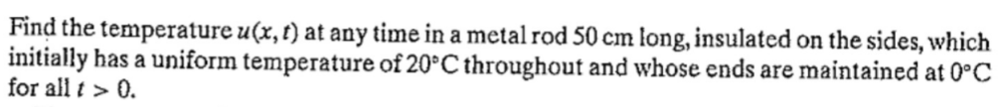

In [70]:
L = 50      # longitud de la barra
alpha = 2       # difusividad térmica
T0 = 0      # BC en x = 0
TL = 0    # BC en x = L

f = 20

print("Función inicial f(x) =")
display(f)

Función inicial f(x) =


20

# ej 1 10-6
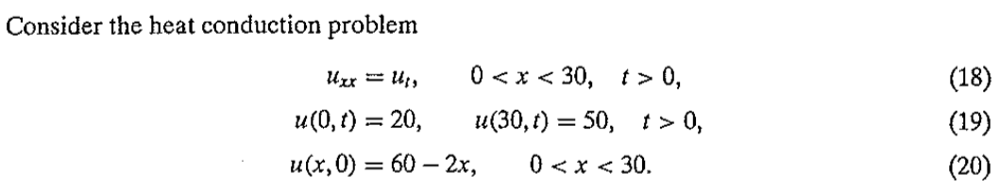

In [48]:
L = 30      # longitud de la barra
alpha = 2       # difusividad térmica
T0 = 20      # BC en x = 0
TL = 50    # BC en x = L

f = 60-2*x

print("Función inicial f(x) =")
display(f)

Función inicial f(x) =


60 - 2⋅x

# ej 1 10-7
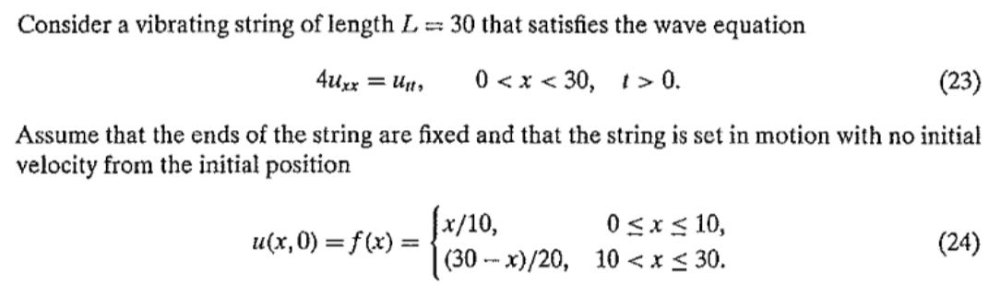

In [88]:
L = 30      # longitud de la cuerda 
a = 4       # velocidad
T0 = 0      # BC en x = 0
TL = 0     # BC en x = L

f = Piecewise(
    (x/10,  (0 <= x) & (x <= 10)),
    ((30-x)/20, (10 < x) & (x <= 30)),
    (0, x > 30),
)

print("Función inicial f(x) por tramos =")
display(f)

Función inicial f(x) por tramos =


⎧  x                        
⎪  ──    for x ≥ 0 ∧ x ≤ 10 
⎪  10                       
⎪                           
⎨3   x                      
⎪─ - ──  for x ≤ 30 ∧ x > 10
⎪2   20                     
⎪                           
⎩  0         for x > 30     

### Separación en parte estacionaria + transitoria

In [89]:

# Parte estacionaria v(x): resolviendo v''(x)=0, v(0)=T0, v(L)=TL
v = T0 + (TL - T0) * (x/L)

print("Solución estacionaria v(x) =")
display(v)

# Condición inicial para v(x,0): v0(x) = f(x) – s(x)
v0 = simplify(f - v)

print("\nv(x,0) = f(x) - s(x) =")
display(v0)


Solución estacionaria v(x) =


0


v(x,0) = f(x) - s(x) =


⎧  x                        
⎪  ──    for x ≥ 0 ∧ x ≤ 10 
⎪  10                       
⎪                           
⎪3   x                      
⎨─ - ──  for x ≤ 30 ∧ x > 10
⎪2   20                     
⎪                           
⎪  0         for x > 30     
⎪                           
⎩ nan         otherwise     

# BLOQUE 4 - Serie de Fourier
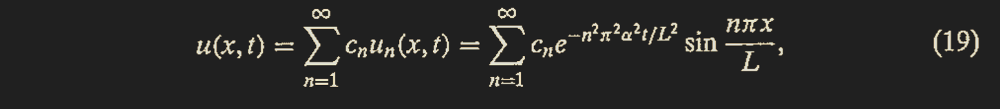
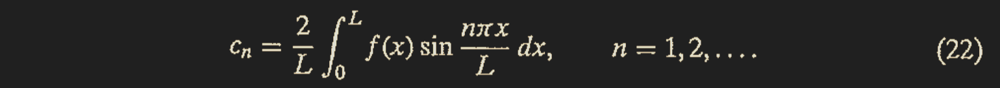

In [90]:
# Fórmula simbólica del coeficiente c_n
n = symbols('n', integer=True, positive=True)
cn_formula = (2/L) * integrate(v0 * sin(n*pi*x/L), (x, 0, L))

print("Coeficiente general c_n =")
display(simplify(cn_formula))

Coeficiente general c_n =


       ⎛π⋅n⎞
9.0⋅sin⎜───⎟
       ⎝ 3 ⎠
────────────
    2  2    
   π ⋅n     

In [84]:
# Para calor
print("u(x,T) =")
display(cn_formula * exp(-(alpha*n*pi/L)**2 * t) * sin(n*pi*x/L))

u(x,T) =


                         2  2              
                       -π ⋅n ⋅t            
⎛           n       ⎞  ─────────           
⎜  40.0⋅(-1)    40.0⎟     625       ⎛π⋅n⋅x⎞
⎜- ────────── + ────⎟⋅ℯ         ⋅sin⎜─────⎟
⎝     π⋅n       π⋅n ⎠               ⎝ 50  ⎠

In [91]:
# Para onda
print("u(x,t) =")
display(cn_formula * cos(-(alpha*n*pi/L) * t) * sin(n*pi*x/L))

u(x,t) =


       ⎛π⋅n⎞    ⎛π⋅n⋅x⎞    ⎛π⋅n⋅t⎞
9.0⋅sin⎜───⎟⋅sin⎜─────⎟⋅cos⎜─────⎟
       ⎝ 3 ⎠    ⎝ 30  ⎠    ⎝ 15  ⎠
──────────────────────────────────
               2  2               
              π ⋅n                

#### Cálculo de coeficientes numéricos (Calor)

In [79]:
N = 100
cn = []

for k in range(1, N+1):
    val = float(cn_formula.subs(n, k))
    cn.append(val)

print("\nPrimeros coeficientes c_n (numéricos):")
for i, c in enumerate(cn[:8], 1):
    print(f"c{i} = {c:.6f}")

# Construcción simbólica de la solución v(x,t) truncada

u_series_sym = 0
for k in range(1, N+1):
    ck = cn_formula.subs(n, k)       # coef simbólico
    term = ck * exp(-(alpha*n*pi/L)**2 * t) * sin(n*pi*x/L)
    u_series_sym += term

print("\nSolución v(x,t) truncada simbólica (antes de sumar v(x)):")
display(simplify(u_series_sym))

# Ahora sumamos la parte estacionaria s(x)

u_full_sym = v + u_series_sym

print("\nSolución completa u(x,t)")
display(simplify(u_full_sym))



Primeros coeficientes c_n (numéricos):
c1 = 25.464791
c2 = 0.000000
c3 = 8.488264
c4 = 0.000000
c5 = 5.092958
c6 = 0.000000
c7 = 3.637827
c8 = 0.000000

Solución v(x,t) truncada simbólica (antes de sumar v(x)):


                    2  2              
                  -π ⋅n ⋅t            
                  ─────────           
                     625       ⎛π⋅n⋅x⎞
235.021987877993⋅ℯ         ⋅sin⎜─────⎟
                               ⎝ 50  ⎠
──────────────────────────────────────
                  π                   


Solución completa u(x,t)


                    2  2              
                  -π ⋅n ⋅t            
                  ─────────           
                     625       ⎛π⋅n⋅x⎞
235.021987877993⋅ℯ         ⋅sin⎜─────⎟
                               ⎝ 50  ⎠
──────────────────────────────────────
                  π                   

##### Cálculo de coeficientes numéricos (Onda)

In [92]:
# Coeficiente correcto para ONDA
A_n_formula = (2/L) * integrate(f * sin(n*pi*x/L), (x, 0, L))

N = 100
A = []

for k in range(1, N+1):
    A.append(float(A_n_formula.subs(n, k)))

print("Coeficientes A_n de la onda:")
for i, c in enumerate(A[:8], 1):
    print(f"A{i} = {c:.6f}")

def u_series_onda(x_array, t_value, A, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += A[k-1] * np.sin(k*np.pi*x_array/L) * np.cos((k*np.pi*a/L)*t_value)
    return total

def u_sol_onda(x_array, t_value):
    return u_series_onda(x_array, t_value, A, N)


Coeficientes A_n de la onda:
A1 = 0.789720
A2 = 0.197430
A3 = 0.000000
A4 = -0.049358
A5 = -0.031589
A6 = 0.000000
A7 = 0.016117
A8 = 0.012339


# BLOQUE 5 - Construcción de u(x,t)

#### Calor

In [80]:
x_vals = np.linspace(0, L, 300)

def v_series_calor(x_array, t_value, cn, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += cn[k-1] * np.sin(k*np.pi*x_array/L) * np.exp(-alpha*(k*np.pi/L)**2 * t_value)
    return total

# Parte estacionaria del calor: v(x)
v_func = lambdify(x, v, 'numpy')

def u_sol_calor(x_array, t_value):
    return v_func(x_array) + v_series_calor(x_array, t_value, cn, N)

# test
u_sol_calor(x_vals, 0)


array([0.00000000e+00, 1.25841788e+01, 2.09996122e+01, 2.35800383e+01,
       2.18717976e+01, 1.91584484e+01, 1.80555795e+01, 1.90077980e+01,
       2.06323729e+01, 2.13250609e+01, 2.06573050e+01, 1.94969386e+01,
       1.89970105e+01, 1.95155222e+01, 2.04185673e+01, 2.08065089e+01,
       2.03798727e+01, 1.96403083e+01, 1.93255392e+01, 1.96899696e+01,
       2.03165338e+01, 2.05797582e+01, 2.02601980e+01, 1.97163617e+01,
       1.94914002e+01, 1.97770987e+01, 2.02577895e+01, 2.04532276e+01,
       2.01939618e+01, 1.97630202e+01, 1.95910505e+01, 1.98291343e+01,
       2.02198950e+01, 2.03727636e+01, 2.01520115e+01, 1.97943593e+01,
       1.96573397e+01, 1.98636681e+01, 2.01935873e+01, 2.03172442e+01,
       2.01230883e+01, 1.98167205e+01, 1.97044834e+01, 1.98882462e+01,
       2.01743800e+01, 2.02767435e+01, 2.01019421e+01, 1.98333662e+01,
       1.97396260e+01, 1.99066359e+01, 2.01598446e+01, 2.02459861e+01,
       2.00857988e+01, 1.98461413e+01, 1.97667484e+01, 1.99209255e+01,
      

#### Onda

In [93]:
x_vals = np.linspace(0, L, 300)

def u_series_onda(x_array, t_value, A, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += A[k-1] * np.sin(k*np.pi*x_array/L) * np.cos((k*np.pi*a/L)*t_value)
    return total

def u_sol_onda(x_array, t_value):
    return u_series_onda(x_array, t_value, A, N)

# test
u_sol_onda(x_vals, 0)


array([0.00000000e+00, 1.00343941e-02, 2.00690687e-02, 3.01027554e-02,
       4.01339423e-02, 5.01636934e-02, 6.01958188e-02, 7.02329527e-02,
       8.02725683e-02, 9.03082994e-02, 1.00336495e-01, 1.10361270e-01,
       1.20391570e-01, 1.30431962e-01, 1.40476607e-01, 1.50513945e-01,
       1.60538600e-01, 1.70558272e-01, 1.80587183e-01, 1.90631421e-01,
       2.00681262e-01, 2.10719770e-01, 2.20740249e-01, 2.30754609e-01,
       2.40782575e-01, 2.50831347e-01, 2.60886641e-01, 2.70925863e-01,
       2.80941413e-01, 2.90950150e-01, 3.00977646e-01, 3.11031783e-01,
       3.21092900e-01, 3.31132335e-01, 3.41142033e-01, 3.51144712e-01,
       3.61172268e-01, 3.71232804e-01, 3.81300260e-01, 3.91339335e-01,
       4.01342015e-01, 4.11338027e-01, 4.21366273e-01, 4.31434532e-01,
       4.41509041e-01, 4.51547061e-01, 4.61541205e-01, 4.71529706e-01,
       4.81559421e-01, 4.91637162e-01, 5.01719725e-01, 5.11755801e-01,
       5.21739354e-01, 5.31719152e-01, 5.41751362e-01, 5.51841011e-01,
      

# BLOQUE 6 - Gráficas 

#### Calor

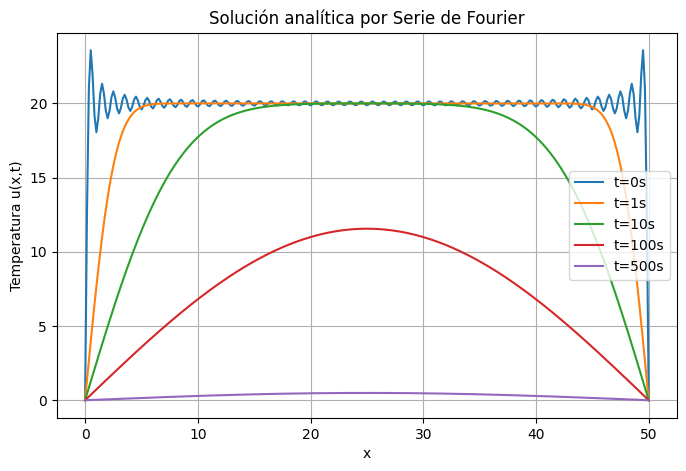

In [81]:
x_vals = np.linspace(0, L, 300)
t_list = [0, 1, 10, 100, 500]

plt.figure(figsize=(8,5))

for ti in t_list:
    ui = u_sol_calor(x_vals, ti)
    plt.plot(x_vals, ui, label=f"t={ti}s")

plt.title("Solución analítica por Serie de Fourier")
plt.xlabel("x")
plt.ylabel("Temperatura u(x,t)")
plt.legend()
plt.grid(True)
plt.show()


#### Onda


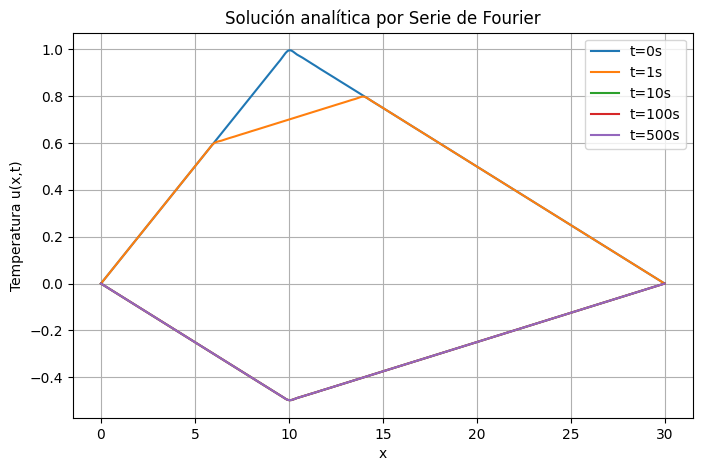

In [95]:
x_vals = np.linspace(0, L, 300)
t_list = [0, 1, 10, 100, 500]

plt.figure(figsize=(8,5))

for ti in t_list:
    ui = u_sol_onda(x_vals, ti)
    plt.plot(x_vals, ui, label=f"t={ti}s")

plt.title("Solución analítica por Serie de Fourier")
plt.xlabel("x")
plt.ylabel("Temperatura u(x,t)")
plt.legend()
plt.grid(True)
plt.show()

# BLOQUE 7 - Animación 

#### Calor

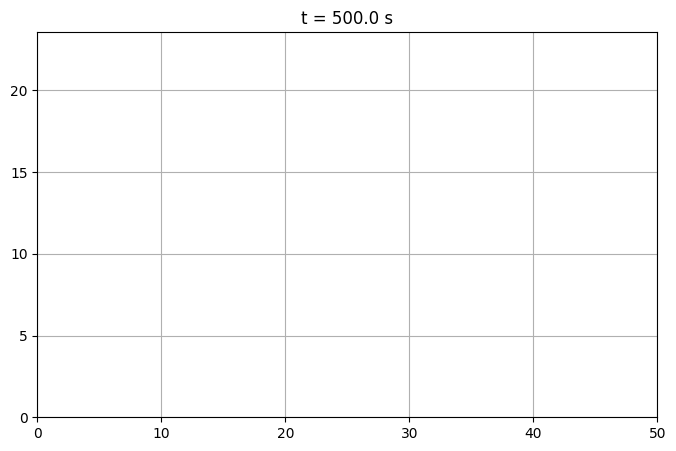

In [77]:
# Figura nueva para la animación
fig, ax = plt.subplots(figsize=(8,5))

# Línea vacía que se va a actualizar
line, = ax.plot([], [], lw=2)

ax.set_xlim(0, L)
ax.set_ylim(np.min(u_sol_calor(x_vals, 500)), np.max(u_sol_calor(x_vals, 0)))
ax.grid(True)

# Definir tiempos para la animación
t_anim = np.linspace(0, 500, 300)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t_val = t_anim[frame]
    u_val = u_sol_calor(x_vals, t_val)  # o u_sol_onda
    line.set_data(x_vals, u_val)
    ax.set_title(f"t = {t_val:.1f} s")
    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(t_anim),
    init_func=init,
    interval=50,
    blit=False
)


from IPython.display import HTML
HTML(anim.to_jshtml())


#### Onda

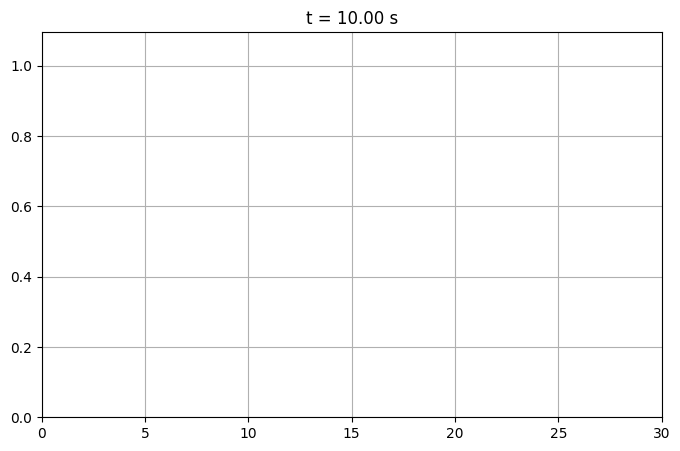

In [96]:
# Figura nueva para la animación
fig, ax = plt.subplots(figsize=(8,5))

# Línea vacía que se va a actualizar
line, = ax.plot([], [], lw=2)

# Elige el modelo con una sola línea
modelo = "onda"   # o "onda"

if modelo == "calor":
    u_test_min = u_sol_calor(x_vals, 500)
    u_test_max = u_sol_calor(x_vals, 0)
    ax.set_ylim(np.min(u_test_min), np.max(u_test_max))

elif modelo == "onda":
    u_test = u_sol_onda(x_vals, 0)
    ax.set_ylim(np.min(u_test)*1.1, np.max(u_test)*1.1)

ax.set_xlim(0, L)
ax.grid(True)

# Definir tiempos para la animación
if modelo == "calor":
    t_anim = np.linspace(0, 500, 300)
else:
    t_anim = np.linspace(0, 10, 300)  # ⚠ la onda oscila rápido → no uses 500 s

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t_val = t_anim[frame]
    
    if modelo == "calor":
        u_val = u_sol_calor(x_vals, t_val)
    else:  # onda
        u_val = u_sol_onda(x_vals, t_val)
    
    line.set_data(x_vals, u_val)
    ax.set_title(f"t = {t_val:.2f} s")
    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(t_anim),
    init_func=init,
    interval=50,
    blit=False
)

from IPython.display import HTML
HTML(anim.to_jshtml())

# BLOQUE 8 - Superficie 3D u(x,t)

#### Calor

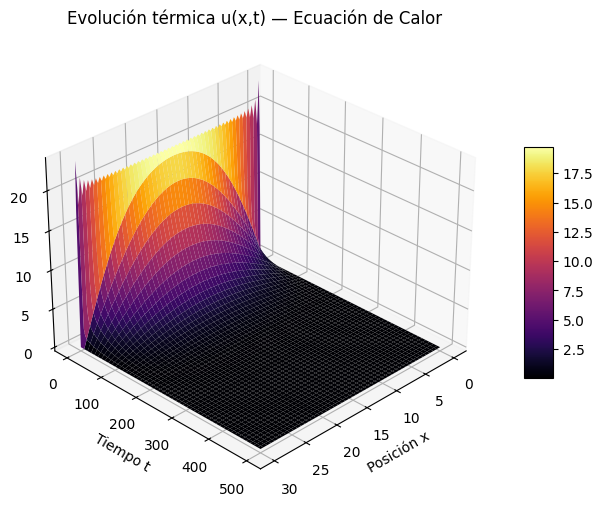

In [99]:

from mpl_toolkits.mplot3d import Axes3D

# Mallado de espacio y tiempo
x_vals = np.linspace(0, L, 200)
t_vals = np.linspace(0, 500, 200)

X, T = np.meshgrid(x_vals, t_vals)

# Matriz U(x,t)
U = np.zeros_like(X)

for i in range(len(t_vals)):
    U[i, :] = u_sol_calor(x_vals, t_vals[i])

# Figura 3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
# Rotar la vista 3D
ax.view_init(elev=30, azim=45)

surf = ax.plot_surface(X, T, U, cmap='inferno', edgecolor='none')

ax.set_title("Evolución térmica u(x,t) — Ecuación de Calor")
ax.set_xlabel("Posición x")
ax.set_ylabel("Tiempo t")
ax.set_zlabel("Temperatura u")

fig.colorbar(surf, shrink=0.5, aspect=8)
plt.show()



#### Onda

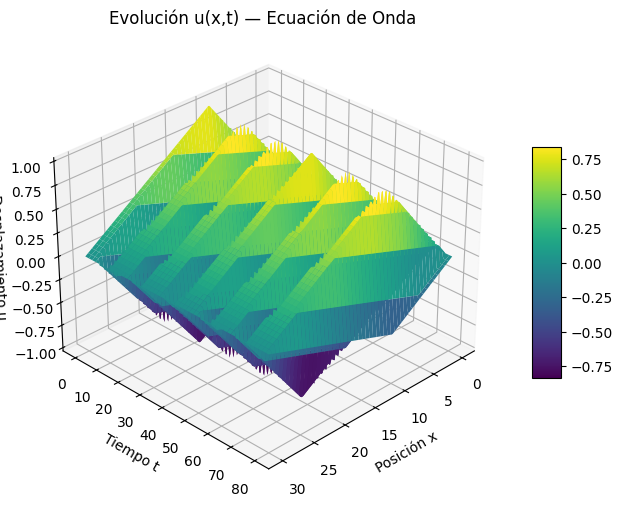

In [100]:
# ===============================================
# BLOQUE — Superficie 3D u(x,t) para la ecuación de onda
# ===============================================
from mpl_toolkits.mplot3d import Axes3D

# Mallado de espacio y tiempo
x_vals = np.linspace(0, L, 200)
t_vals = np.linspace(0, 80, 200)  # la onda oscila rápido → tiempos pequeños

X, T = np.meshgrid(x_vals, t_vals)

# Matriz U(x,t)
U = np.zeros_like(X)

for i in range(len(t_vals)):
    U[i, :] = u_sol_onda(x_vals, t_vals[i])

# Figura 3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
# Rotar la vista 3D
ax.view_init(elev=30, azim=45)
surf = ax.plot_surface(X, T, U, cmap='viridis', edgecolor='none')

ax.set_title("Evolución u(x,t) — Ecuación de Onda")
ax.set_xlabel("Posición x")
ax.set_ylabel("Tiempo t")
ax.set_zlabel("Desplazamiento u")

fig.colorbar(surf, shrink=0.5, aspect=8)
plt.show()


# Bloque 9 - Solución con FTCS

In [64]:
# ===============================================
# DEFINICIÓN RÁPIDA DE explicit_fd (FTCS)
# ===============================================

def explicit_fd(f_init, L, a, T0, TL, nx=200, t_max=80):
    """
    Esquema explícito FTCS para ecuación de calor:
        u_t = a * u_xx
    con BC: u(0,t)=T0, u(L,t)=TL
    """

    dx = L/(nx-1)
    dt = 0.4 * dx**2 / a     # estabilidad CFL
    nt = int(t_max / dt) + 1

    x_grid = np.linspace(0, L, nx)
    times = np.linspace(0, t_max, nt)

    u = f_init(x_grid)             # condición inicial
    u[0], u[-1] = T0, TL           # condiciones de frontera

    hist = np.zeros((nt, nx))
    hist[0] = u.copy()

    r = a * dt / dx**2             # número de Fourier

    for k in range(1, nt):
        un = u.copy()
        u[1:-1] = un[1:-1] + r * (un[2:] - 2*un[1:-1] + un[:-2])
        u[0], u[-1] = T0, TL
        hist[k] = u.copy()

    return x_grid, times, hist


# Bloque 10 - Error entre solución analítica y computacional

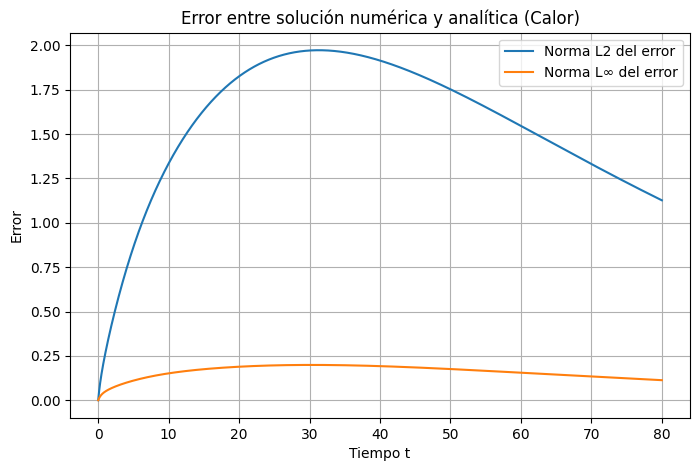

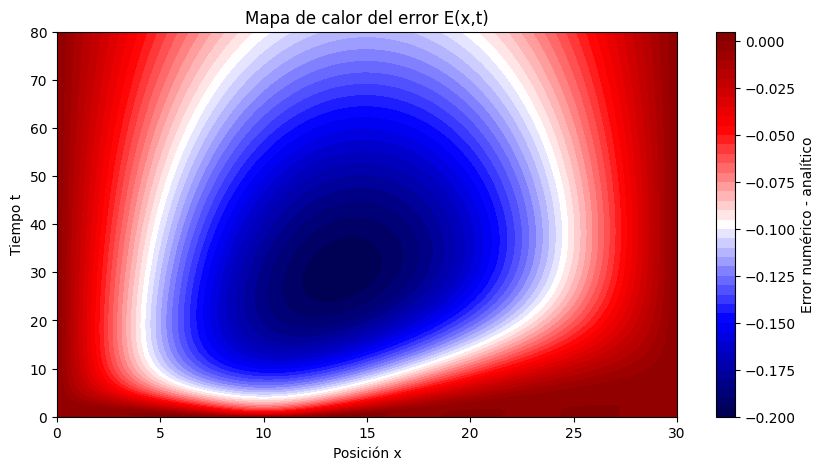

In [65]:
# ===============================================
# BLOQUE — PROTOTIPO DE ANÁLISIS DE ERROR
# ===============================================

import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1. Solución numérica (FTCS)
# -----------------------------

# f_init_fn ya debe estar definido o puedes definir uno simple:
f_init_fn = lambda X: u_sol_calor(X,0)   # usa tu calor como inicial

x_fd, times_fd, u_fd = explicit_fd(
    f_init_fn, L, a, T0, TL,
    nx=200, t_max=80
)

# -----------------------------
# 2. Solución analítica
# -----------------------------

X = x_fd
T = times_fd

U_analytic = np.zeros_like(u_fd)
for i, t in enumerate(T):
    U_analytic[i] = u_sol_calor(X, t)

# -----------------------------
# 3. Error puntual
# -----------------------------
Error = u_fd - U_analytic

# Normas
L2 = np.sqrt(np.sum(Error**2, axis=1))
Linf = np.max(np.abs(Error), axis=1)

# -----------------------------
# 4. Plots del error
# -----------------------------

plt.figure(figsize=(8,5))
plt.plot(T, L2, label='Norma L2 del error')
plt.plot(T, Linf, label='Norma L∞ del error')
plt.xlabel("Tiempo t")
plt.ylabel("Error")
plt.title("Error entre solución numérica y analítica (Calor)")
plt.grid(True)
plt.legend()
plt.show()

# -----------------------------
# 5. Mapa de calor del error
# -----------------------------

plt.figure(figsize=(10,5))
plt.contourf(X, T, Error, 40, cmap='seismic')
plt.colorbar(label="Error numérico - analítico")
plt.xlabel("Posición x")
plt.ylabel("Tiempo t")
plt.title("Mapa de calor del error E(x,t)")
plt.show()
